**Задание 1: Стандартные аугментации torchvision (15 баллов)**\
**Создайте пайплайн стандартных аугментаций torchvision (например, RandomHorizontalFlip, RandomCrop, ColorJitter, RandomRotation, RandomGrayscale).**\
**Примените аугментации к 5 изображениям из разных классов (папка train).**\
**Визуализируйте:**\
**Оригинал**\
**Результат применения каждой аугментации отдельно**\
**Результат применения всех аугментаций вместе**\


=== Стандартные аугментации torchvision ===

 Изображение 1, класс: Гароу


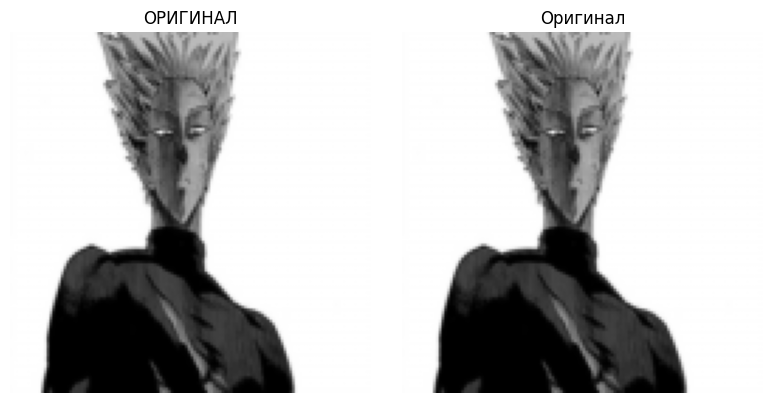

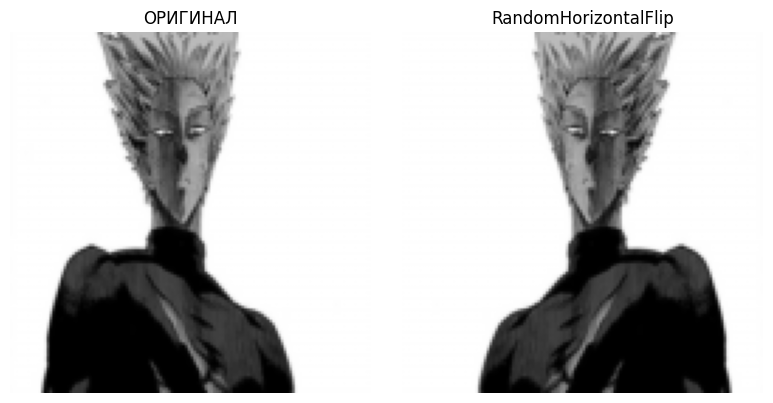

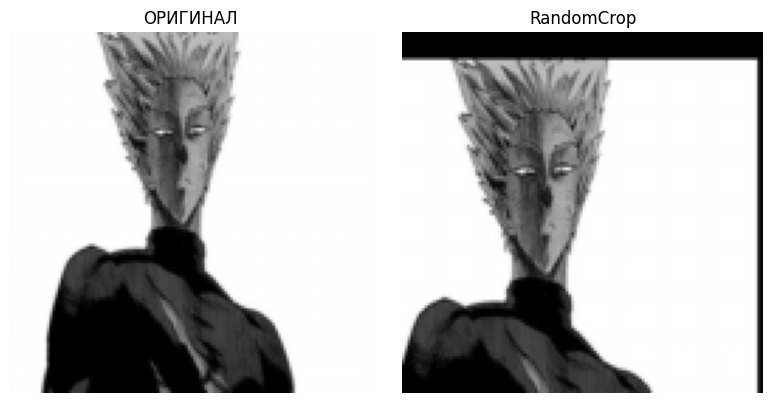

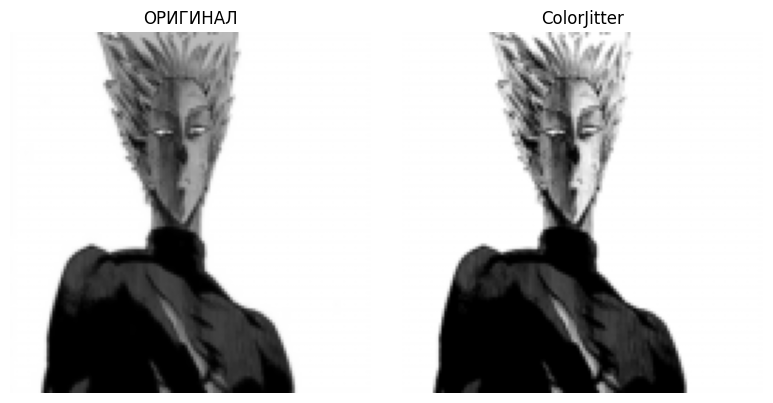

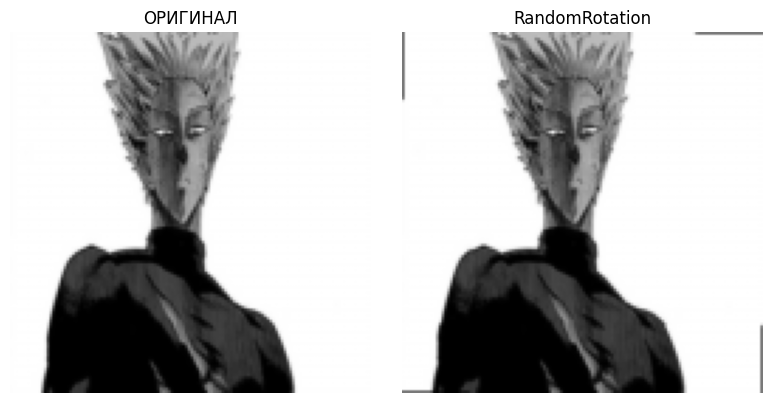

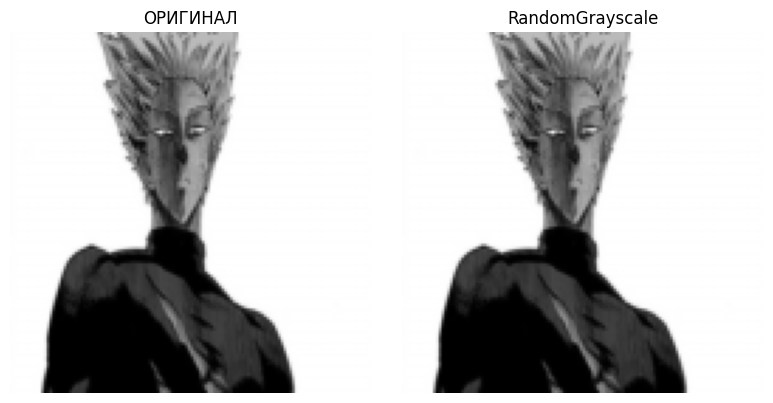

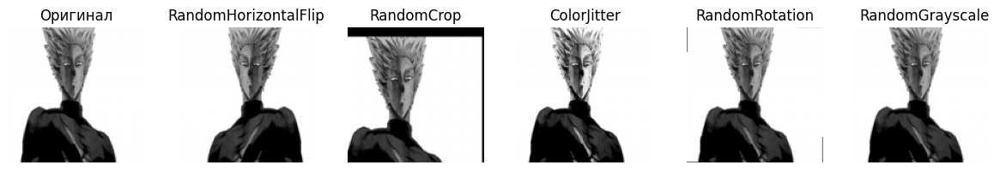

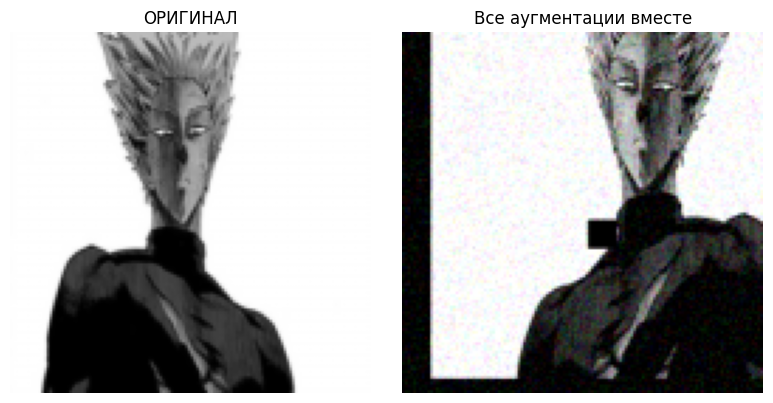


 Изображение 2, класс: Генос


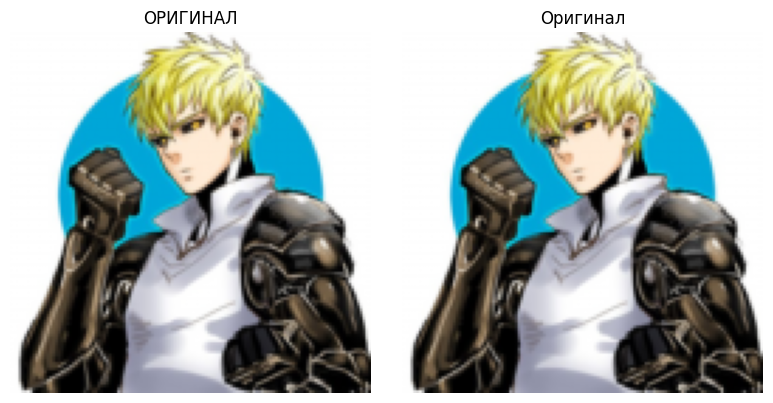

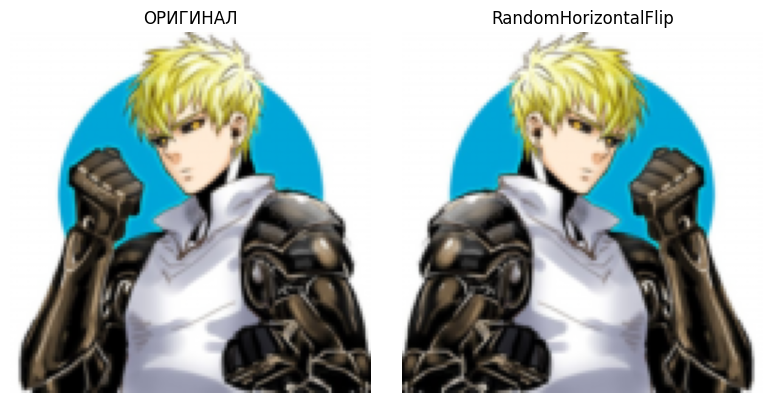

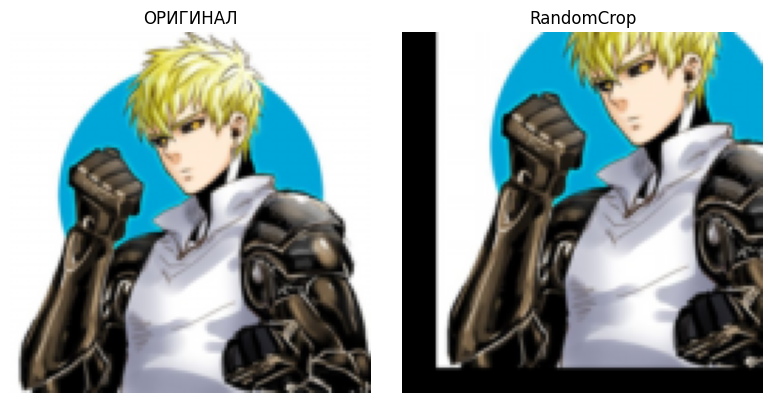

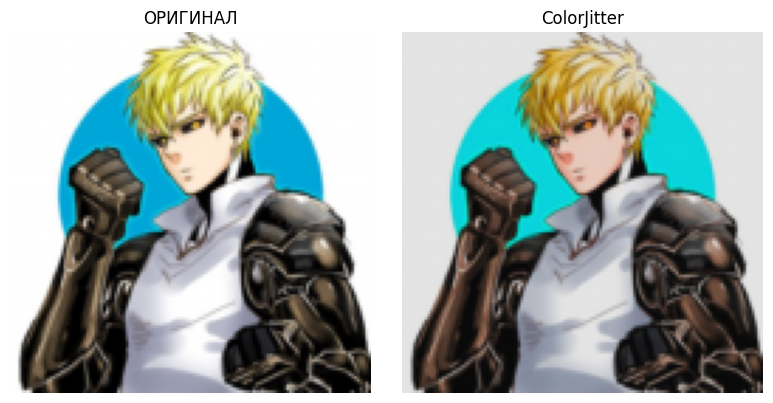

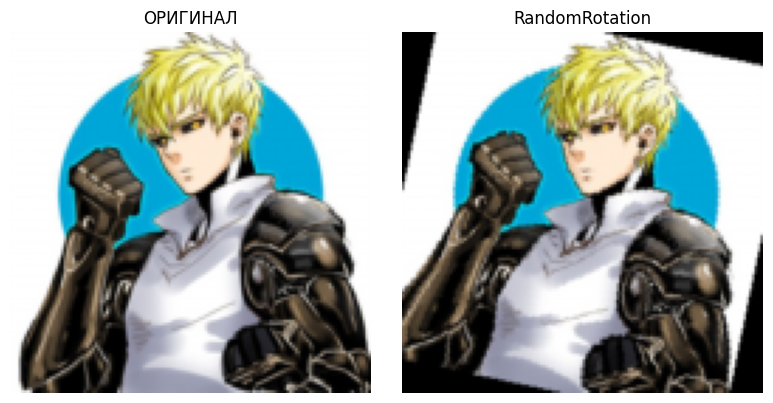

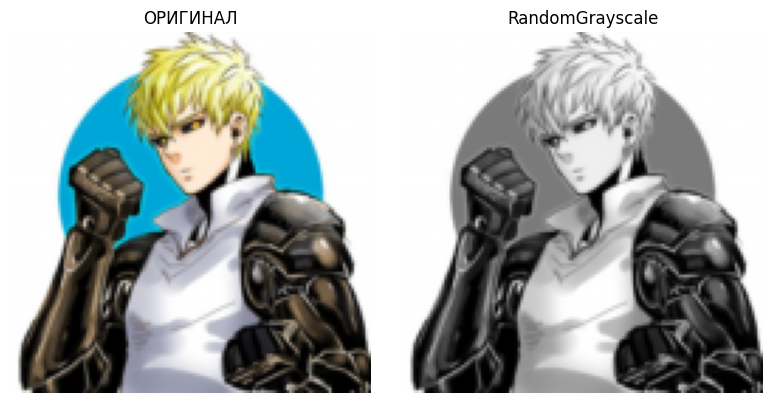

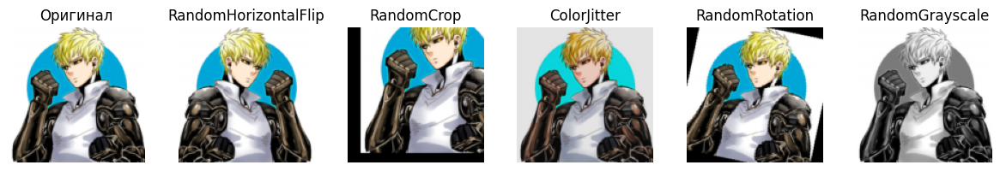

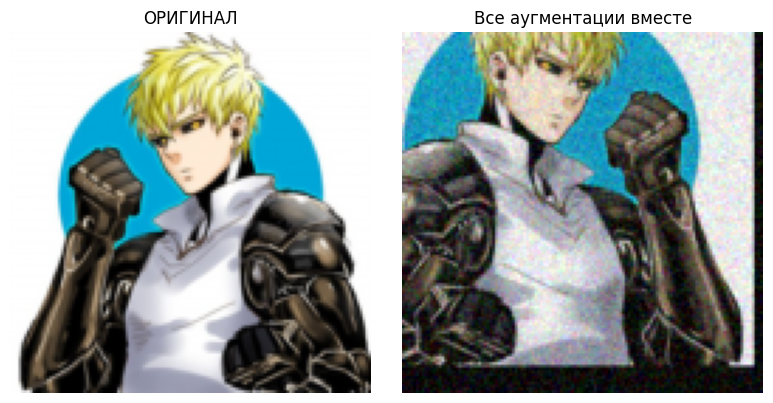


 Изображение 3, класс: Сайтама


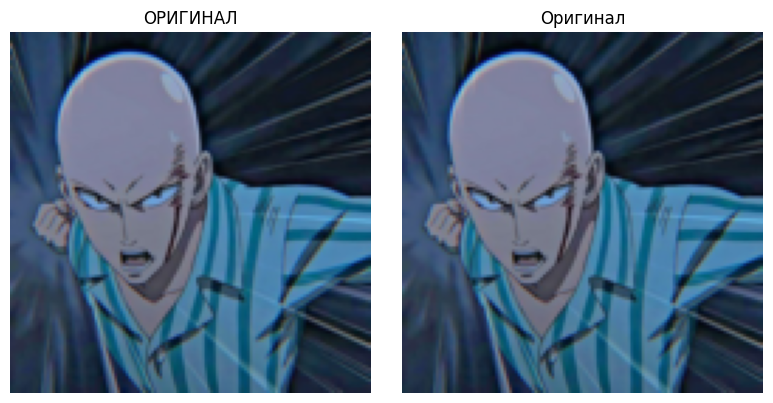

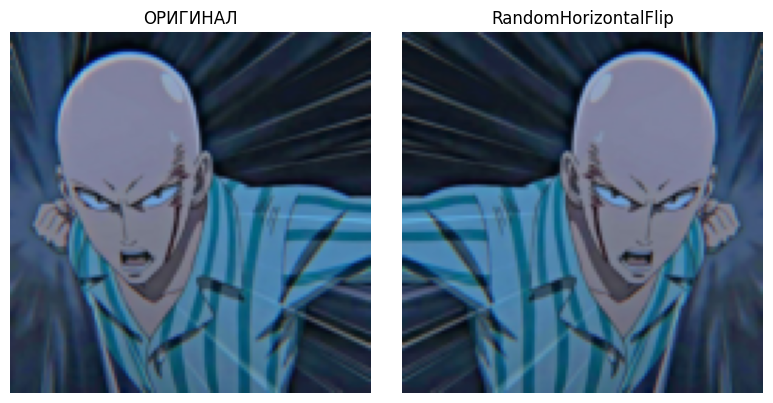

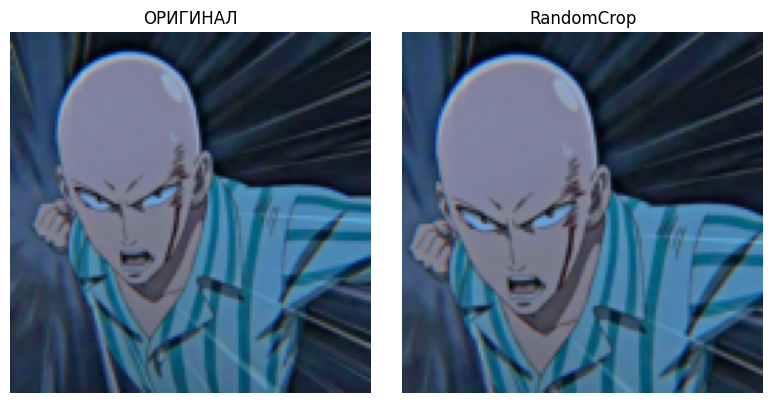

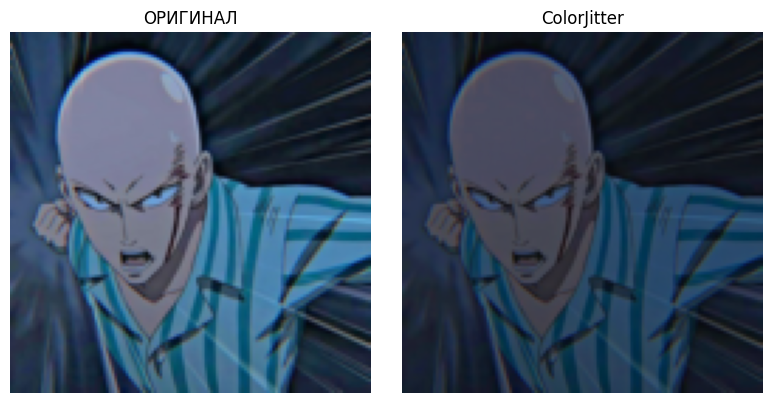

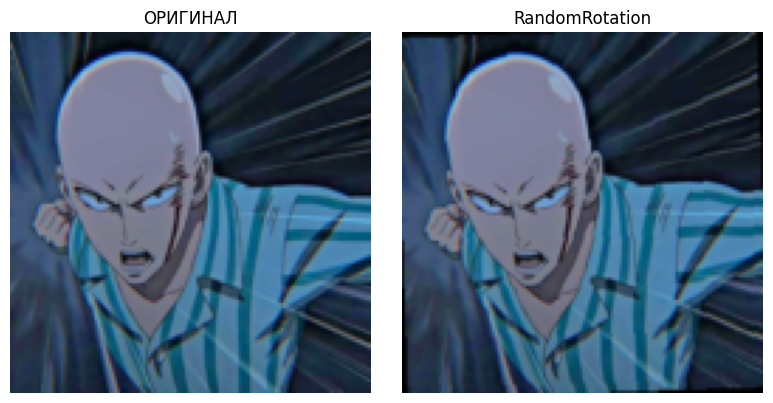

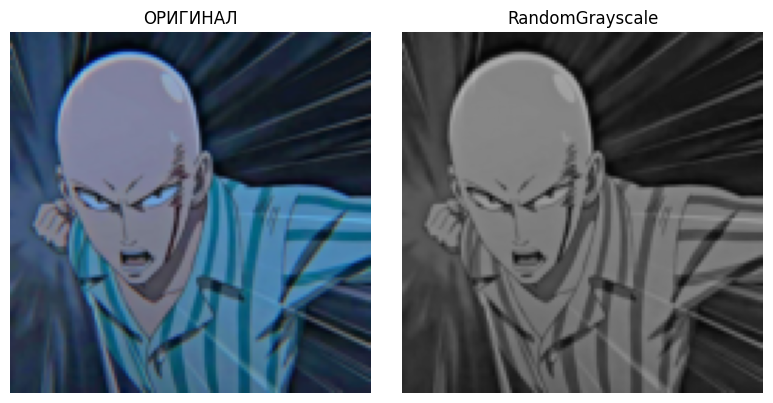

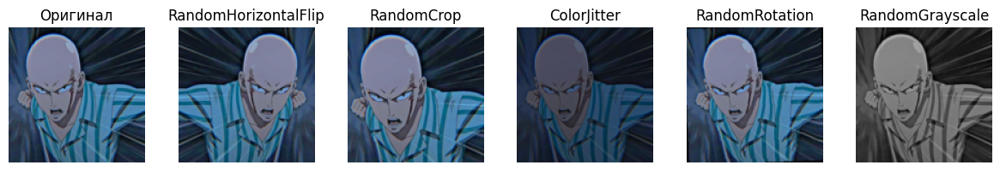

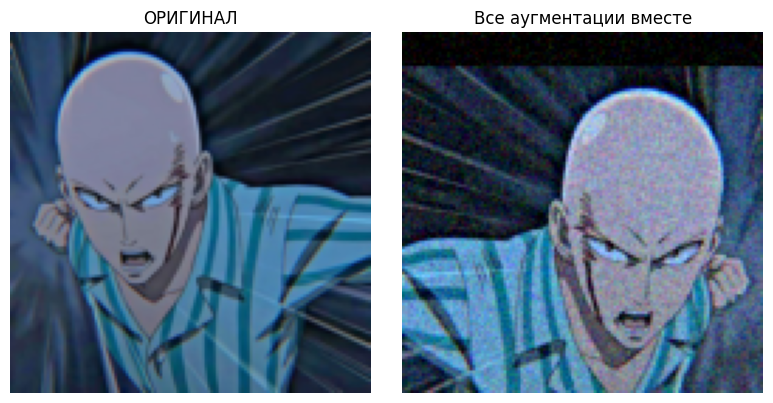


 Изображение 4, класс: Соник


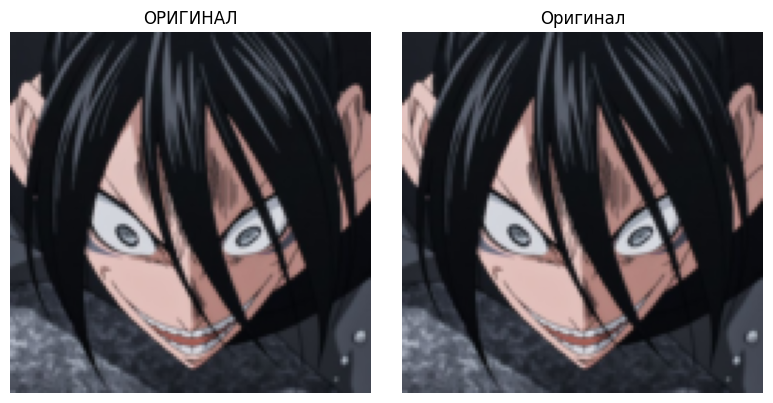

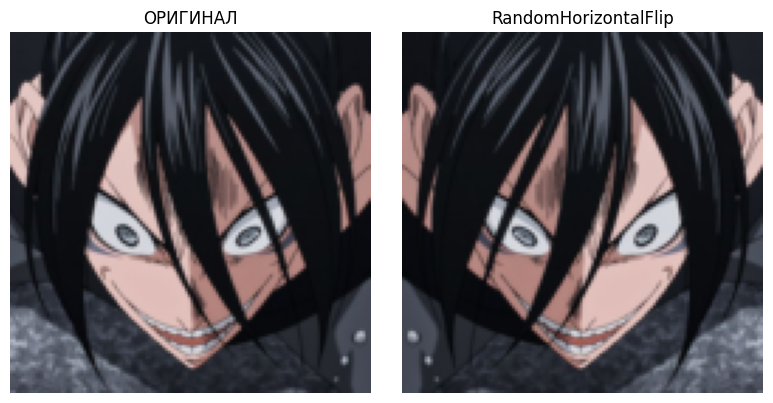

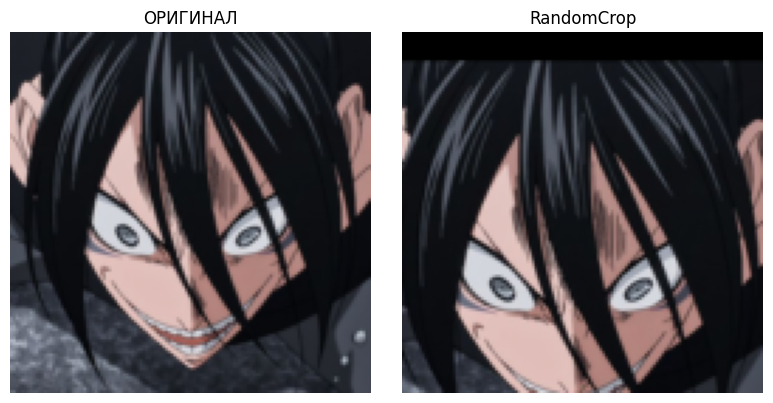

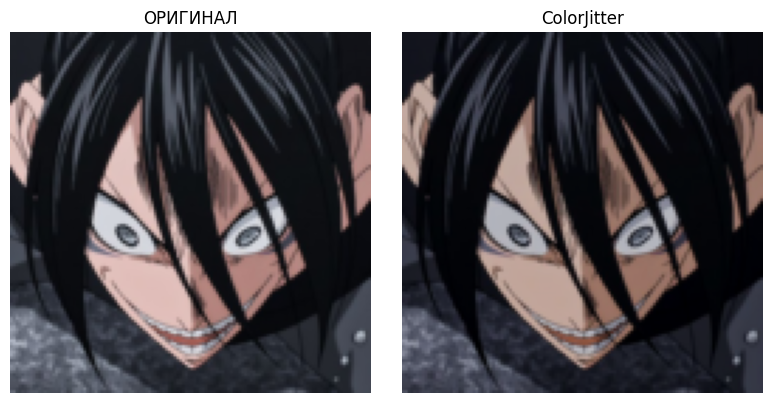

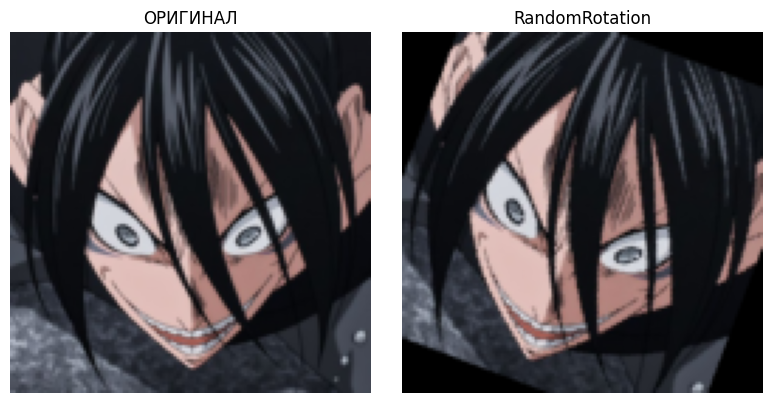

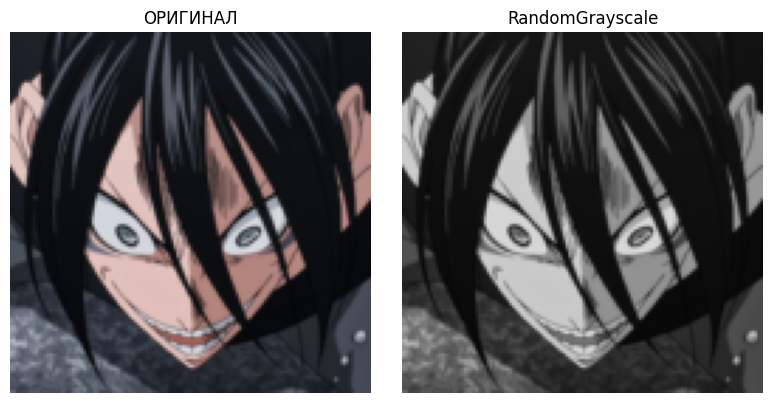

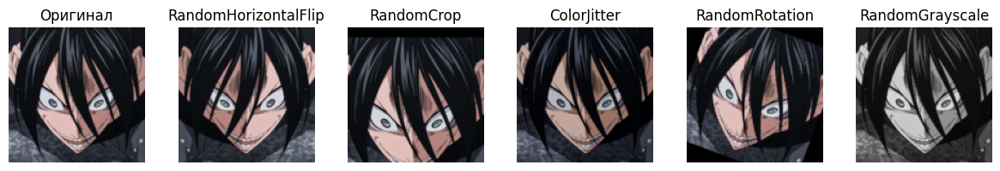

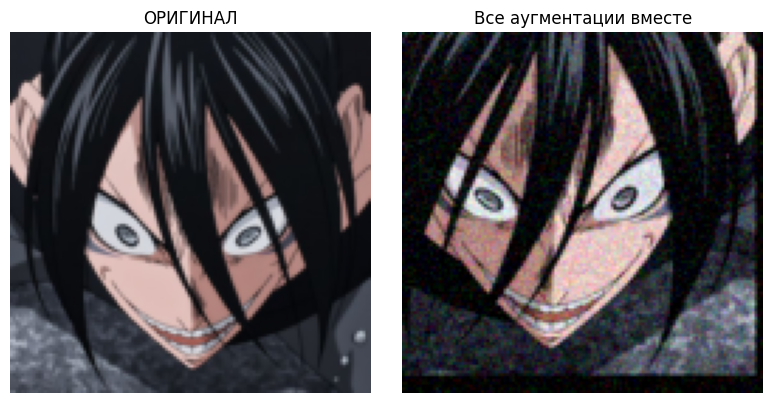


 Изображение 5, класс: Татсумаки


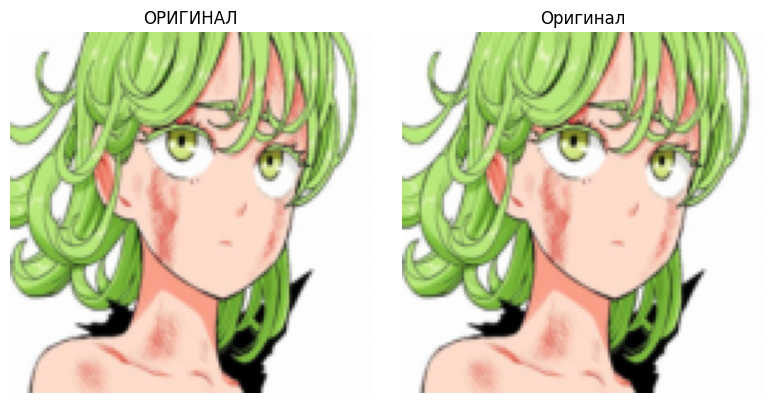

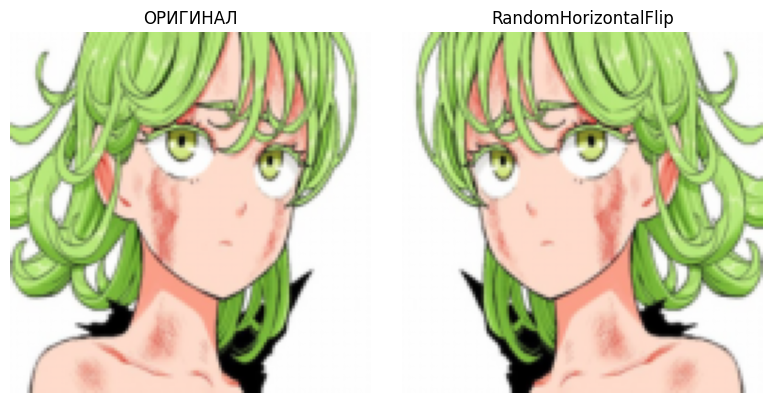

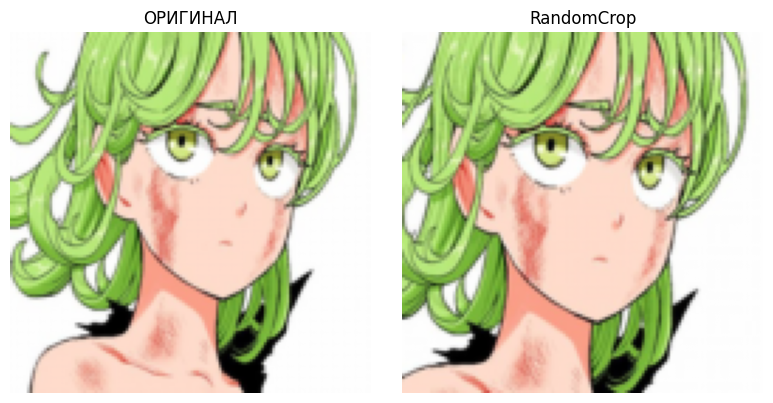

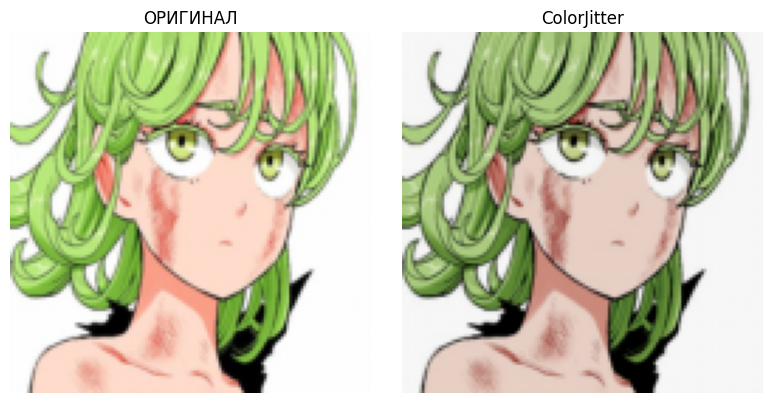

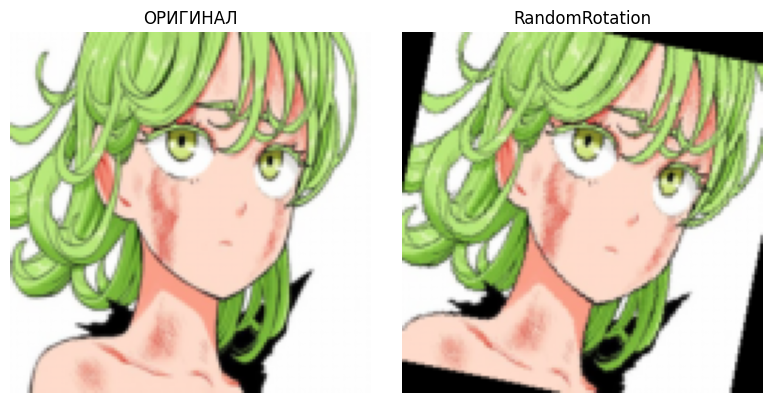

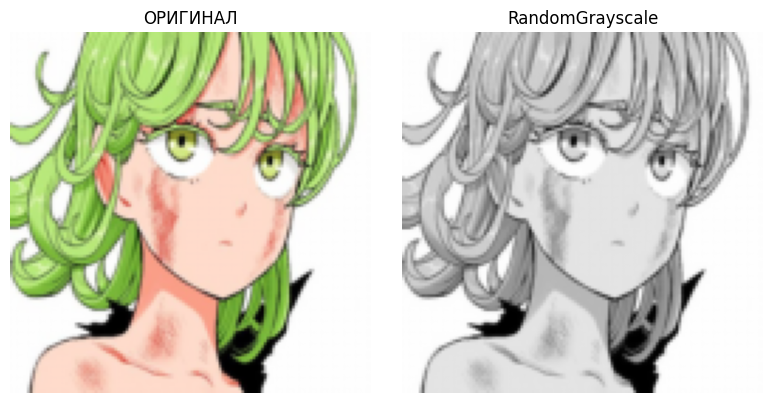

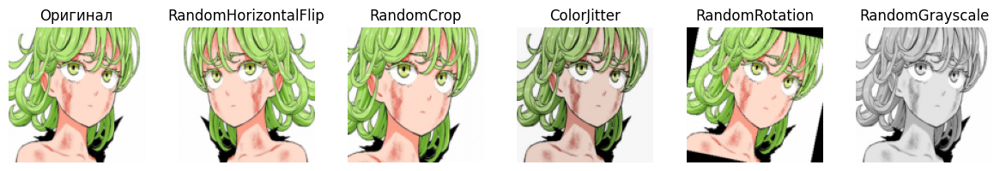

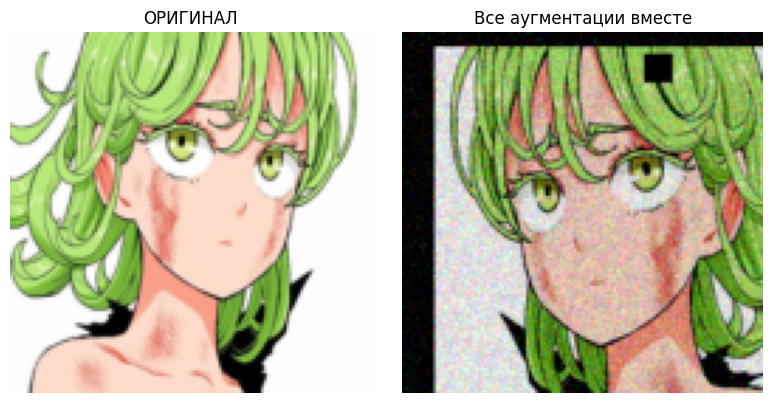

In [9]:
import torch
from torchvision import transforms
from PIL import Image
from datasets import CustomImageDataset
from utils import show_images, show_single_augmentation, show_multiple_augmentations
from extra_augs import (AddGaussianNoise, RandomErasingCustom, CutOut, 
                       Solarize, Posterize, AutoContrast, ElasticTransform)


# Загрузка датасета без аугментаций
root = 'data/train'
dataset = CustomImageDataset(root, transform=None, target_size=(224, 224))
class_names = dataset.get_class_names()

#Берем 5 изображений из разных классов, запоминаем классы которые брали уже, сохраняем изображение с которыми будем работать
used_classes = []
images = []
counter = 0 #счетчик до 5 изображений
for img, label in dataset:
    if (label not in used_classes):
        images.append(img)
        used_classes.append(label)
        counter+=1
    if counter==5:
        break


standard_augs = [
    ("RandomHorizontalFlip", transforms.RandomHorizontalFlip(p=1.0)),
    ("RandomCrop", transforms.RandomCrop(200, padding=20)),
    ("ColorJitter", transforms.ColorJitter(brightness=0.5, contrast=0.5, saturation=0.5, hue=0.1)),
    ("RandomRotation", transforms.RandomRotation(degrees=30)),
    ("RandomGrayscale", transforms.RandomGrayscale(p=1.0))
]

combined_aug = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.8),
    transforms.RandomCrop(200, padding=20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    AddGaussianNoise(0., 0.1),
    CutOut(p=0.5)
])

#проходимся по всем изображениям
print("\n=== Стандартные аугментации torchvision ===")
for i in range(5):
    img = images[i]
    used_class = used_classes[i] #индекс класса
    print(f"\n Изображение {i+1}, класс: {class_names[used_class]}")

    #отображение оригинала
    show_single_augmentation(img, img, title="Оригинал", save_path=f'results/task1/{class_names[used_class]}_original.png')

    augmented_imgs = []
    titles = []
    for name, aug in standard_augs:
        aug_transform = transforms.Compose([
            aug,
            transforms.ToTensor()
        ])
        aug_img = aug_transform(img)
        augmented_imgs.append(aug_img)
        titles.append(name)

        #отображение каждой аугментации
        show_single_augmentation(img, aug_img, title=name, save_path=f'results/task1/{class_names[used_class]}_{name}.png')

    #отображение пути каждой стадии аугментации
    show_multiple_augmentations(img, augmented_imgs, titles, save_path=f'results/task1/{class_names[used_class]}_full_aug_way.png')
    #отображение итоговой картинки после аугментации
    combined_img = combined_aug(img)
    show_single_augmentation(img, combined_img, title="Все аугментации вместе", save_path=f'results/task1/{class_names[used_class]}_{name}_full_aug_complete.png')


**Задание 2: Кастомные аугментации (20 баллов)**\
**Реализуйте минимум 3 кастомные аугментации (например, случайное размытие, случайная перспектива, случайная яркость/контрастность).**\
**Примените их к изображениям из train.**\
**Сравните визуально с готовыми аугментациями из extra_augs.py.**


 Изображение 1, класс: Гароу

 Аугментация AddGaussianNoise из extra_augs


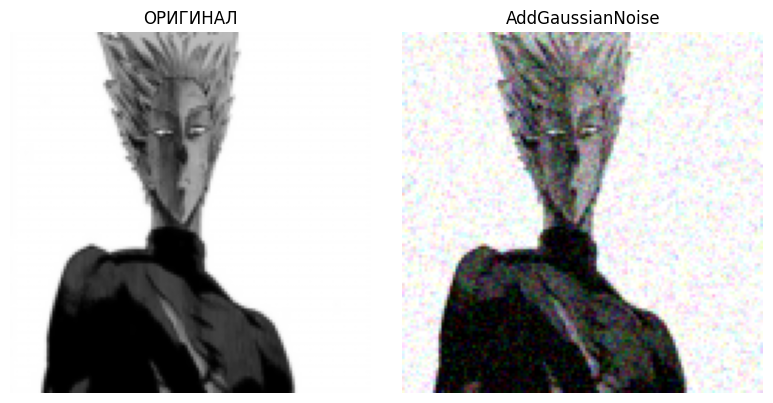


 моя кастомная аугментация RandomBlur


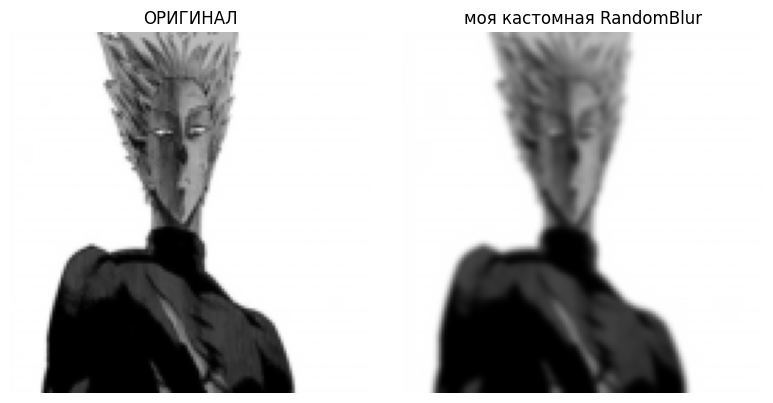


 Аугментация RandomErasingCustom из extra_augs


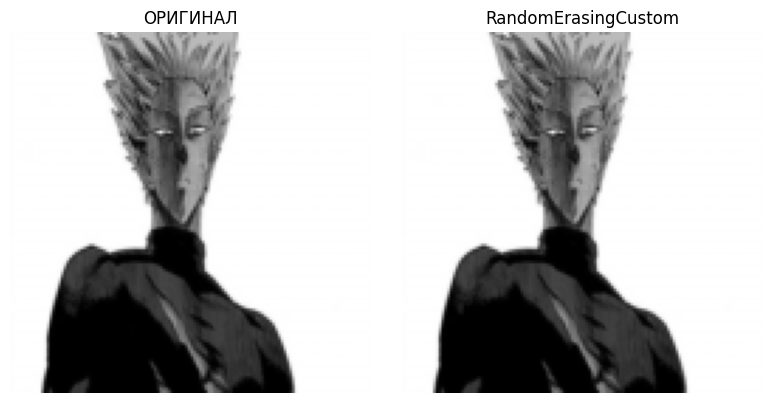


 моя кастомная аугментация RandomRectangleBlack


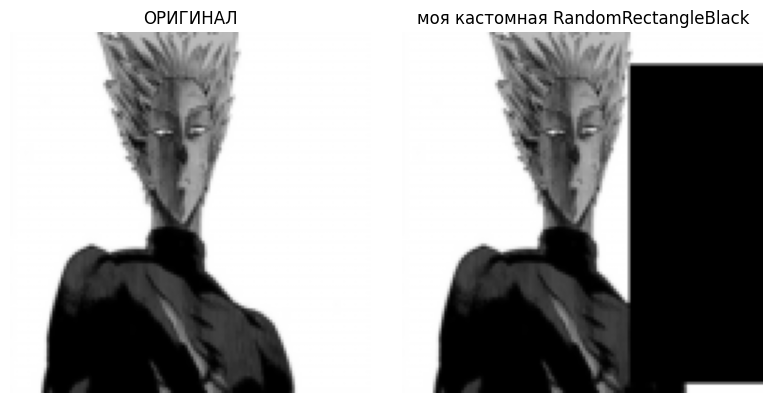


 Аугментация CutOut из extra_augs


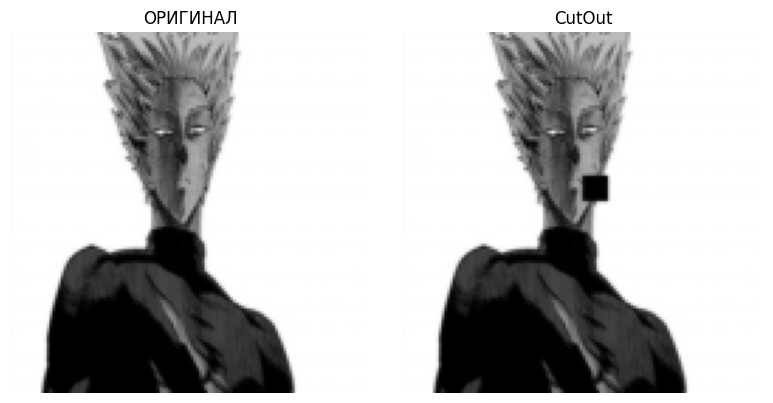


 моя кастомная аугментация RandomSquareBlack


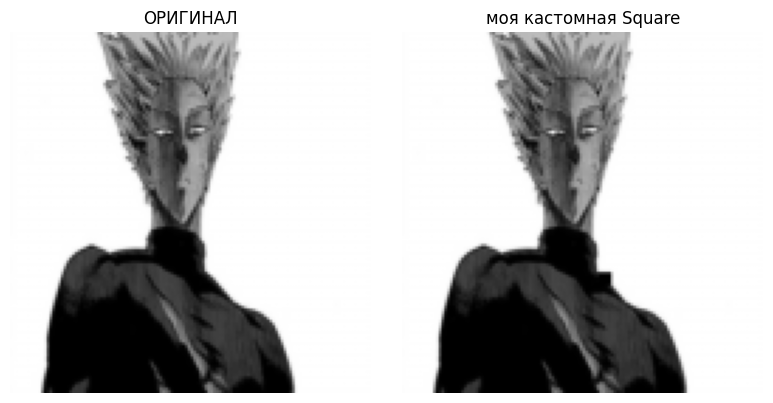


 Изображение 2, класс: Генос

 Аугментация AddGaussianNoise из extra_augs


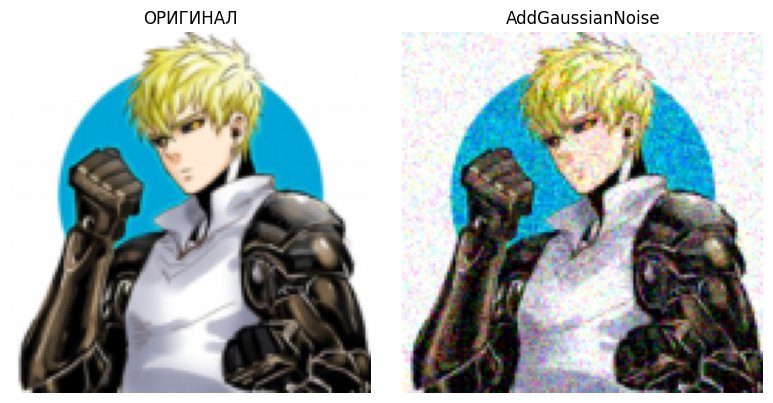


 моя кастомная аугментация RandomBlur


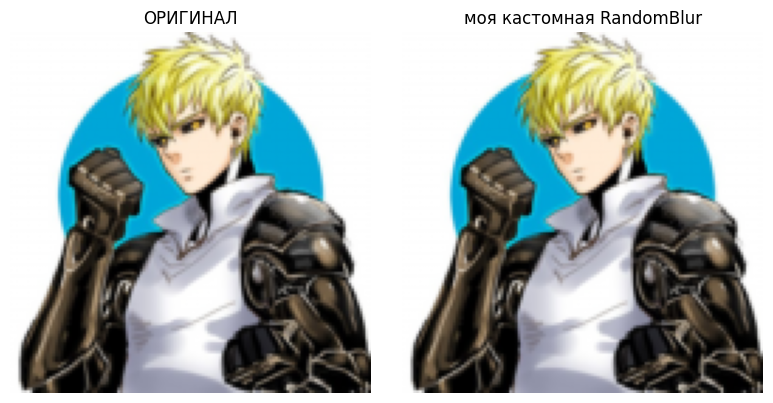


 Аугментация RandomErasingCustom из extra_augs


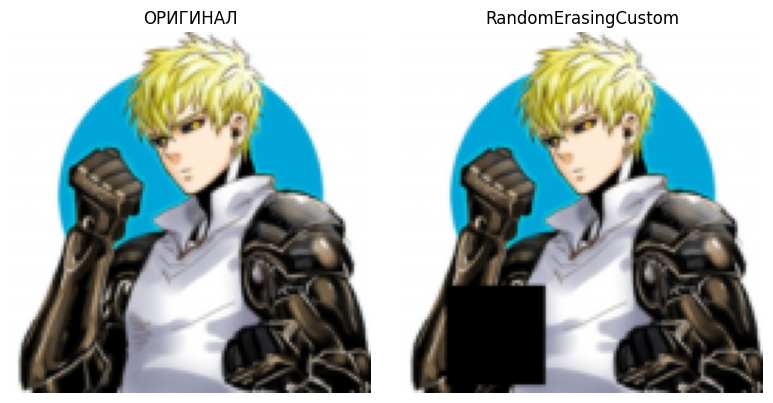


 моя кастомная аугментация RandomRectangleBlack


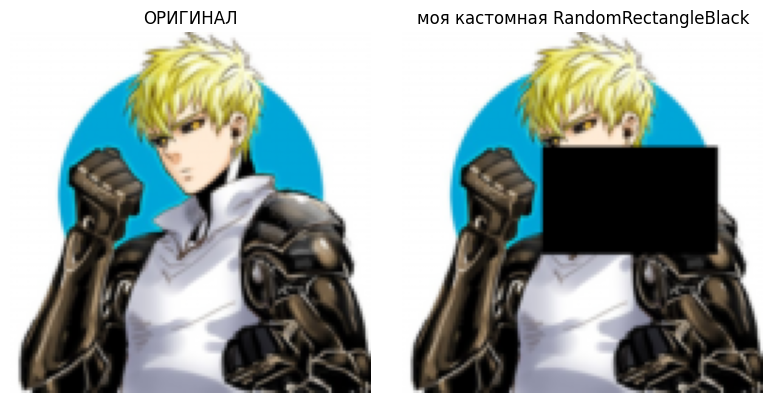


 Аугментация CutOut из extra_augs


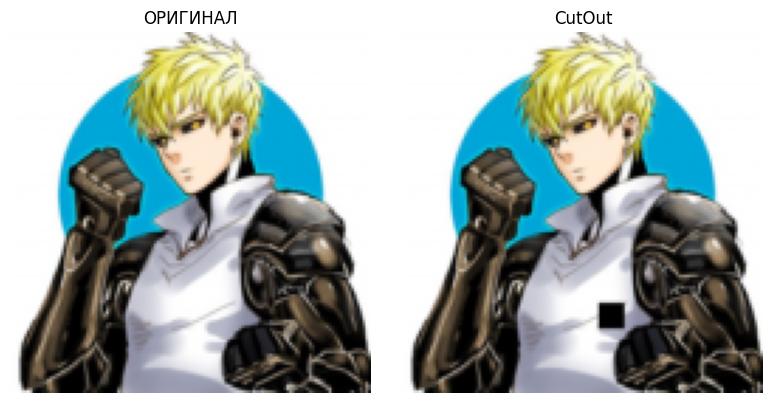


 моя кастомная аугментация RandomSquareBlack


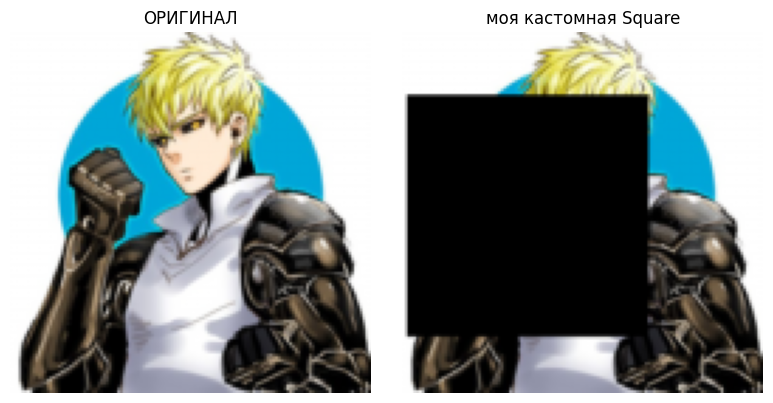

In [12]:
import random
import cv2
import numpy as np
import torch
import torch
from torchvision import transforms
from PIL import Image
from datasets import CustomImageDataset
from utils import show_images, show_single_augmentation, show_multiple_augmentations
from extra_augs import (AddGaussianNoise, RandomErasingCustom, CutOut)
class RandomBlur:
    """Применяет случайное размытие к изображению."""
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, img):
        if random.random() > self.p:
            return img
        
        img_np = img.numpy().transpose(1, 2, 0)

        #выбираем случайное значение для размера ядра, ядро может быть только нечетным, поэтому подбираем пока не будет четным
        x=2
        while x%2==0:
            x = random.randint(1,20)
        kernel_size = (x,x)

        #применяем гаусовское размытие
        img_blur = cv2.GaussianBlur(img_np, kernel_size, 0)
        return torch.from_numpy(img_blur.transpose(2, 0, 1))
    
class RandomSquareBlack:
    """Случайное затирание квадратной области изображения."""
    def __init__(self, p=0.5):
        self.p = p
    def __call__(self, img):
        if random.random() > self.p:
            return img

        c, h, w = img.shape

        # Выбирал случайный размер квадрата
        if h < w: #подбираем сторону квадрата, так чтобы была меньше наименьшей стороны
            square = random.randint(1, h)
        else:
            square = random.randint(1, w)

        # Выбираем координаты, чтобы влез координат
        x = random.randint(0, w - square)
        y = random.randint(0, h - square)

        # Закрашиваем квадрат
        img[:, y:y+square, x:x+square] = 0 

        return img

class RandomRectangleBlack:
    """Случайное затирание прямоугольной области изображения."""
    def __init__(self, p=0.5):
        self.p = p
    def __call__(self, img):
        if random.random() > self.p:
            return img

        c, h, w = img.shape

        # Выбирал случайный размер прямоугольника
        h1 = random.randint(1, h)
        w1 = random.randint(1, w)

        #проверка на квадрат
        while w1 == h1:
            w1 = random.randint(1, w)

        # Выбираем координаты, чтобы влез координат
        x = random.randint(0, w - w1)
        y = random.randint(0, h - h1)

        # Закрашиваем прямоугольник
        img[:, y:y+h1, x:x+w1] = 0 

        return img



# Загрузка датасета без аугментаций
root = 'data/train'
dataset = CustomImageDataset(root, transform=None, target_size=(224, 224))
class_names = dataset.get_class_names()

#Берем 2 изображений из разных классов, запоминаем классы которые брали уже, сохраняем изображение с которыми будем работать
used_classes = []
images = []
counter = 0 #счетчик до 2 изображений
for img, label in dataset:
    if (label not in used_classes):
        images.append(img)
        used_classes.append(label)
        counter+=1
    if counter==2:
        break

#проходимся по всем изображениям
for i in range(2):
    img = images[i]
    used_class = used_classes[i] #индекс класса
    print(f"\n Изображение {i+1}, класс: {class_names[used_class]}")
    
    print(f"\n Аугментация AddGaussianNoise из extra_augs")
    noise_aug = transforms.Compose([
        transforms.ToTensor(),
        AddGaussianNoise(0., 0.2)
    ])
    noise_img = noise_aug(img)
    show_single_augmentation(img, noise_img, title="AddGaussianNoise", save_path=f'results/task2/{class_names[used_class]}_AddGaussianNoise.png')

    print(f"\n моя кастомная аугментация RandomBlur")
    noise_aug2 = transforms.Compose([
        transforms.ToTensor(),
        RandomBlur(p=1)
    ])
    noise_img = noise_aug2(img)
    show_single_augmentation(img, noise_img, title="моя кастомная RandomBlur", save_path=f'results/task2/{class_names[used_class]}_custom_RandomBlur.png')



    print(f"\n Аугментация RandomErasingCustom из extra_augs")
    eras_aug = transforms.Compose([
        transforms.ToTensor(),
        RandomErasingCustom(p=1)
    ])
    eras_img = eras_aug(img)
    show_single_augmentation(img, eras_img, title="RandomErasingCustom", save_path=f'results/task2/{class_names[used_class]}_RandomErasingCustom.png')

    print(f"\n моя кастомная аугментация RandomRectangleBlack")
    eras_aug2 = transforms.Compose([
        transforms.ToTensor(),
        RandomRectangleBlack(p=1)
    ])
    eras_img = eras_aug2(img)
    show_single_augmentation(img, eras_img, title="моя кастомная RandomRectangleBlack", save_path=f'results/task2/{class_names[used_class]}_custom_RandomRectangleBlack.png')




    print(f"\n Аугментация CutOut из extra_augs")
    cut_aug = transforms.Compose([
        transforms.ToTensor(),
        CutOut(p=1)
    ])
    cut_img = cut_aug(img)
    show_single_augmentation(img, cut_img, title="CutOut", save_path=f'results/task2/{class_names[used_class]}_CutOut.png')

    print(f"\n моя кастомная аугментация RandomSquareBlack")
    cut_aug2 = transforms.Compose([
        transforms.ToTensor(),
        RandomSquareBlack(p=1)
    ])
    cut_img = cut_aug2(img)
    show_single_augmentation(img, cut_img, title="моя кастомная Square", save_path=f'results/task2/{class_names[used_class]}_custom_Square.png')



**Задание 3: Анализ датасета (10 баллов)**\
**Подсчитайте количество изображений в каждом классе.**\
**Найдите минимальный, максимальный и средний размеры изображений.**\
**Визуализируйте распределение размеров и гистограмму по классам.**

Количество изображений по классам:
Гароу: 130
Генос: 130
Сайтама: 130
Соник: 130
Татсумаки: 130
Фубуки: 130

Мин. размер: (220, 220)
Макс. размер: (736, 1308)
Средний размер: 546x629


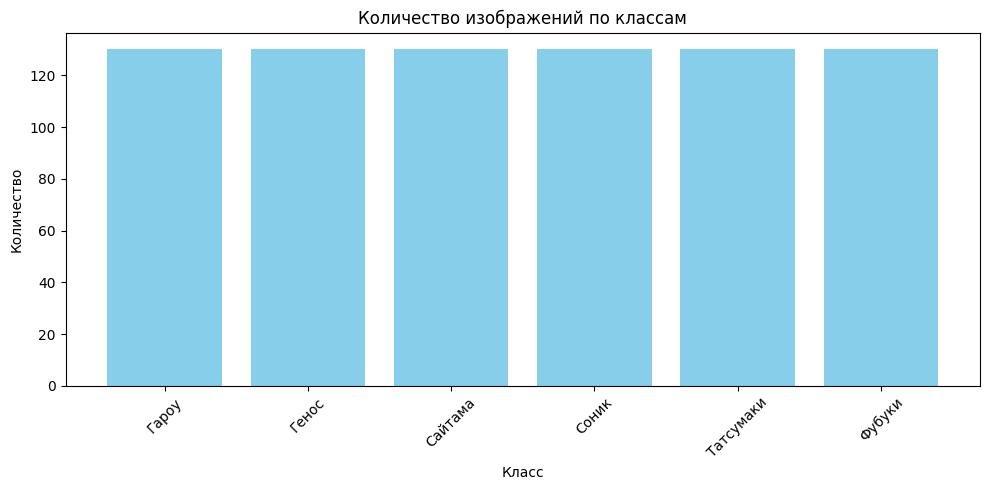

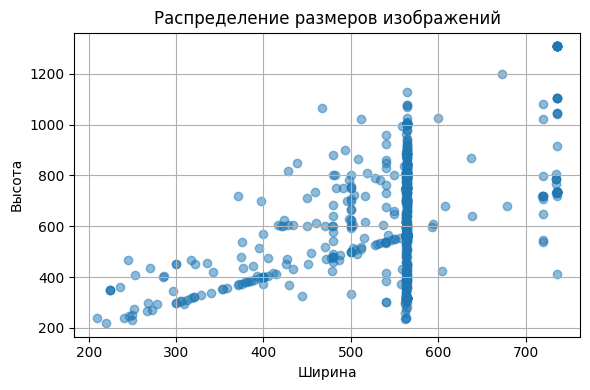

In [2]:
from datasets import CustomImageDataset
from PIL import Image
import matplotlib.pyplot as plt

# Загрузка датасета
root = 'data/train'
dataset11 = CustomImageDataset(root, transform=None)
class_names = dataset11.get_class_names()

res = {}
sizes = [] #список размеров изображений

w0, h0 = dataset11[0][0].size
min_size = (w0, h0) #мин размер
max_size = (w0, h0)
total_w, total_h = 0, 0

for img, label in dataset11:
    w, h = img.size

    # Считаем количество изображений по классам
    if label not in res:
        res[label] = 0
    res[label] += 1
    sizes.append((w, h))
    # Проверяем на мин и макс размер
    if (w * h) < (min_size[0] * min_size[1]):
        min_size = (w, h)
    if (w * h) > (max_size[0] * max_size[1]):
        max_size = (w, h)
    total_w += w
    total_h += h
    
root = 'data/test'
dataset12 = CustomImageDataset(root, transform=None, target_size=(224, 224))
for img, label in dataset12:
    w, h = img.size

    # Считаем количество изображений по классам
    if label not in res:
        res[label] = 0
    res[label] += 1
    sizes.append((w, h))
    # Проверяем на мин и макс размер
    if (w * h) < (min_size[0] * min_size[1]):
        min_size = (w, h)
    if (w * h) > (max_size[0] * max_size[1]):
        max_size = (w, h)
    total_w += w
    total_h += h

avg_w = total_w / len(sizes)
avg_h = total_h / len(sizes)


print("Количество изображений по классам:")
for label, count in res.items():
    print(f"{class_names[label]}: {count}")

print(f"\nМин. размер: {min_size}")
print(f"Макс. размер: {max_size}")
print(f"Средний размер: {avg_w:.0f}x{avg_h:.0f}")

# Гистограмма по классам
plt.figure(figsize=(10, 5))
plt.bar([class_names[l] for l in res.keys()], res.values(), color='skyblue')
plt.title("Количество изображений по классам")
plt.xlabel("Класс")
plt.ylabel("Количество")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('results/task3/histogram.png')
plt.show()

#Распределение размеров
widths = [w for w, h in sizes]
heights = [h for w, h in sizes]

plt.figure(figsize=(6, 4))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Распределение размеров изображений")
plt.xlabel("Ширина")
plt.ylabel("Высота")
plt.grid(True)
plt.tight_layout()
plt.savefig('results/task3/sizes.png')
plt.show()

**Задание 4: Pipeline аугментаций (20 баллов)**\
**Реализуйте класс AugmentationPipeline с методами:**\
**add_augmentation(name, aug)**\
**remove_augmentation(name)**\
**apply(image)**\
**get_augmentations()**\
**Создайте несколько конфигураций (light, medium, heavy).**\
**Примените каждую конфигурацию к train и сохраните результаты.**

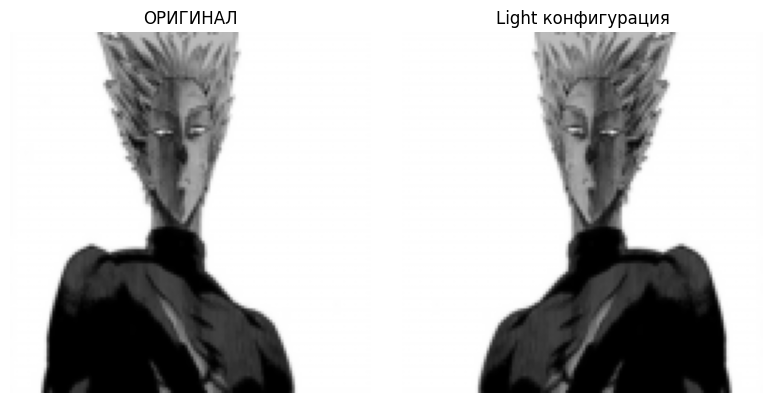

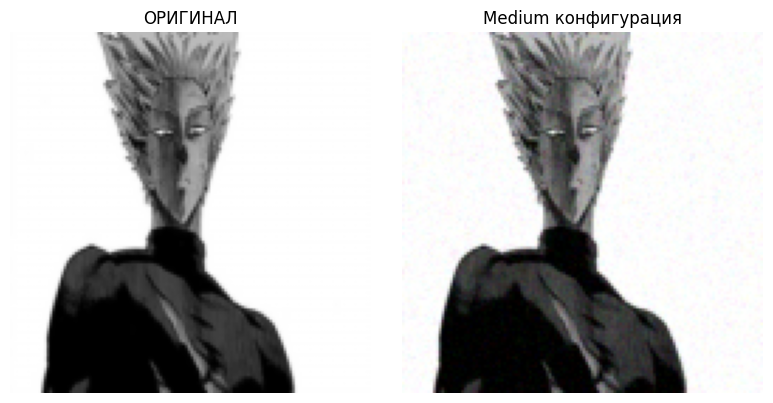

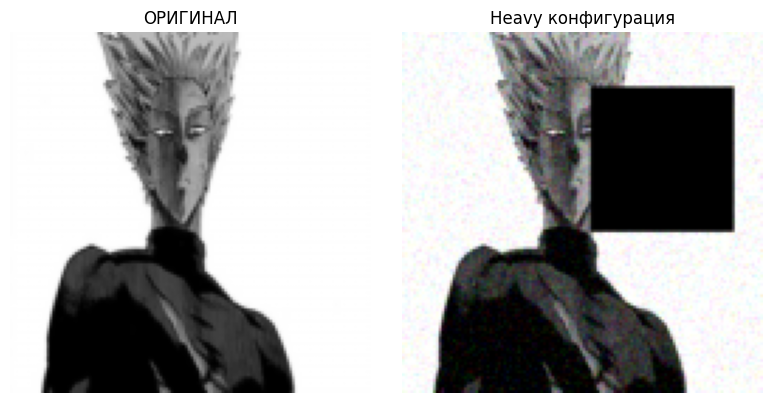

In [1]:
from torchvision import transforms
from extra_augs import AddGaussianNoise, AutoContrast, CutOut, ElasticTransform, RandomErasingCustom
from datasets import CustomImageDataset
from torchvision.transforms import ToTensor
from utils import show_single_augmentation
class AugmentationPipeline:
    """Управление пайплайном аугментаций"""
    def __init__(self):
        self.augmentations = {}

    def add_augmentation(self, name, aug):
        self.augmentations[name] = aug

    def remove_augmentation(self, name):
        del self.augmentations[name]

    def apply(self, image):
        image = ToTensor()(image)
        img = image
        for aug in self.augmentations.values():
            img = aug(img)
        return img
    
    def get_augmentations(self):
        return list(self.augmentations.keys())

#light конфигурация
light = AugmentationPipeline()
light.add_augmentation("RandomHorizontalFlip", transforms.RandomHorizontalFlip(p=1))

#medium конфигурация
medium = AugmentationPipeline()
medium.add_augmentation("AutoContrast", AutoContrast(p=1))
medium.add_augmentation("AddGaussianNoise", AddGaussianNoise(0., 0.05))

#heavy конфигурация
heavy = AugmentationPipeline()
heavy.add_augmentation("AddGaussianNoise", AddGaussianNoise(0., 0.1))
heavy.add_augmentation("CutOut", CutOut(p=1))
heavy.add_augmentation("ElasticTransform", ElasticTransform(p=1, alpha=1, sigma=8))
heavy.add_augmentation("RandomErasingCustom", RandomErasingCustom(p=1))

dataset = CustomImageDataset("data/train", transform=None)
img, label = dataset[0]

#запуск
aug_img_litgh = light.apply(img)
aug_img_medium = medium.apply(img)
aug_img_heavy = heavy.apply(img)

#визуализация результата
show_single_augmentation(img, aug_img_litgh, title="Light конфигурация", save_path="results/task4/light.png")
show_single_augmentation(img, aug_img_medium, title="Medium конфигурация", save_path="results/task4/medium.png")
show_single_augmentation(img, aug_img_heavy, title="Heavy конфигурация", save_path="results/task4/heavy.png")

**Задание 5: Эксперимент с размерами (10 баллов)**\
**Проведите эксперимент с разными размерами изображений (например, 64x64, 128x128, 224x224, 512x512).**\
**Для каждого размера измерьте время загрузки и применения аугментаций к 100 изображениям, а также потребление памяти.**\
**Постройте графики зависимости времени и памяти от размера.**

Размер: 64x64
Время: 0.95 сек
Пиковое потребление памяти: 0.18 МБ
Размер: 128x128
Время: 1.13 сек
Пиковое потребление памяти: 0.17 МБ
Размер: 224x224
Время: 1.29 сек
Пиковое потребление памяти: 0.33 МБ
Размер: 512x512
Время: 2.49 сек
Пиковое потребление памяти: 1.54 МБ


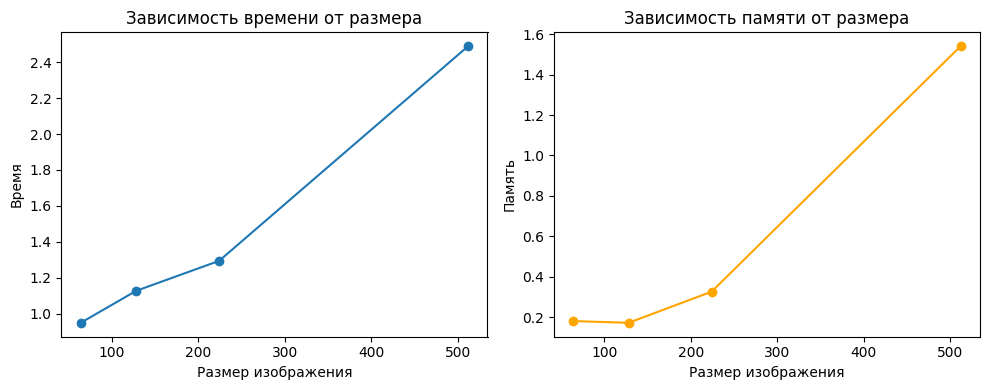

In [6]:
import time
import tracemalloc
import matplotlib.pyplot as plt
from torchvision import transforms
from datasets import CustomImageDataset
from PIL import Image
from extra_augs import (AddGaussianNoise, RandomErasingCustom, CutOut, 
                       Solarize, Posterize, AutoContrast, ElasticTransform)

# Размеры
sizes = [64, 128, 224, 512]

combined_aug = transforms.Compose([
    transforms.ToTensor(),
    RandomErasingCustom(p=1),
    AddGaussianNoise(0., 0.1),
    CutOut(p=1)
])

times = []
mem = []

for size in sizes:
    print(f"Размер: {size}x{size}")
    
    # Измерение памяти
    tracemalloc.start()

    start_time = time.time()

    dataset = CustomImageDataset("data/train", target_size=(size, size), transform=combined_aug)

    # Применяем к 100 изображениям
    for i in range(100):
        img, label = dataset[i]

    end = time.time() - start_time
    current, peak = tracemalloc.get_traced_memory()
    tracemalloc.stop()
    tracemalloc.stop()

    times.append(end)
    mem.append(peak / 1024 / 1024)  # в МБ

    print(f"Время: {end:.2f} сек")
    print(f"Пиковое потребление памяти: {mem[-1]:.2f} МБ")


# Построение графиков
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(sizes, times, marker='o')
plt.title("Зависимость времени от размера")
plt.xlabel("Размер изображения")

plt.ylabel("Время")

plt.subplot(1, 2, 2)
plt.plot(sizes, mem, marker='o', color='orange')
plt.title("Зависимость памяти от размера")
plt.xlabel("Размер изображения")
plt.ylabel("Память")

plt.tight_layout()
plt.savefig('results/task5/time_and_memory.png')
plt.show()


**Задание 6: Дообучение предобученных моделей (25 баллов)**\
**Возьмите одну из предобученных моделей torchvision (например, resnet18, efficientnet_b0, mobilenet_v3_small).**\
**Замените последний слой на количество классов вашего датасета.**\
**Дообучите модель на train, проверьте качество на val.**\
**Визуализируйте процесс обучения (loss/accuracy).**

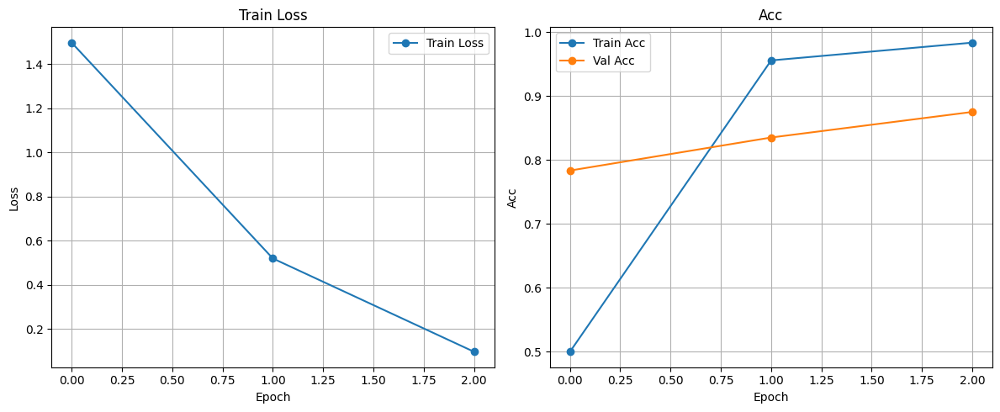

In [8]:
import matplotlib.pyplot as plt
import torch
from torchvision import transforms,models
from datasets import CustomImageDataset
from torch.utils.data import DataLoader
from PIL import Image
from extra_augs import AddGaussianNoise

# Подготовка датасета
transform = transforms.Compose([
    transforms.ToTensor(),
    AddGaussianNoise(0., 0.1),
    transforms.Resize((224, 224)),
])

train_dataset = CustomImageDataset('data/train', transform=transform)
val_dataset = CustomImageDataset('data/test', transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)

#колво классов
ln_classes = len(train_dataset.get_class_names())

# Загрузка предобученной модели
model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, ln_classes) #изменили последний слой, почему 1, потому что в ней два слоя

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

train_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(3):
    model.train()
    total_loss = 0
    correct_train = 0
    total_train = 0

    for x, y in train_loader:
        x, y = x.to(device), y.to(device)

        optimizer.zero_grad()
        out = model(x)
        loss = loss_fn(out, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        preds = torch.argmax(out, dim=1)
        correct_train += (preds == y).sum().item()
        total_train += y.size(0)

    avg_train_loss = total_loss / len(train_loader)
    avg_train_acc = correct_train / total_train

    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_acc)

    model.eval()
    correct_val = 0
    total_val = 0

    with torch.no_grad():
        for x, y in val_loader:
            x, y = x.to(device), y.to(device)
            out = model(x)
            preds = torch.argmax(out, dim=1)
            correct_val += (preds == y).sum().item()
            total_val += y.size(0)

    avg_val_acc = correct_val / total_val
    val_accuracies.append(avg_val_acc)

#Визуализация
plt.figure(figsize=(12, 5))

#Loss на train
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Train Loss')
plt.grid(True)
plt.legend()

#Acc train and val
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Acc', marker='o')
plt.plot(val_accuracies, label='Val Acc', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Acc')
plt.title('Acc')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.savefig("results/task6/loss_accuracy_plot.png")
plt.show()
